# Basics

## Generative Adversarial Networks (GANs)
### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will alternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stability and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Here's an example of what your outputs from the 3 different models you're going to train should look like... note that GANs are sometimes finicky, so your outputs might not look exactly like this... this is just meant to be a *rough* guideline of the kind of quality you can expect:
![caption](https://web.eecs.umich.edu/~justincj/teaching/eecs498/assets/a6/gan_outputs_pytorch.png)

In [161]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## datasets

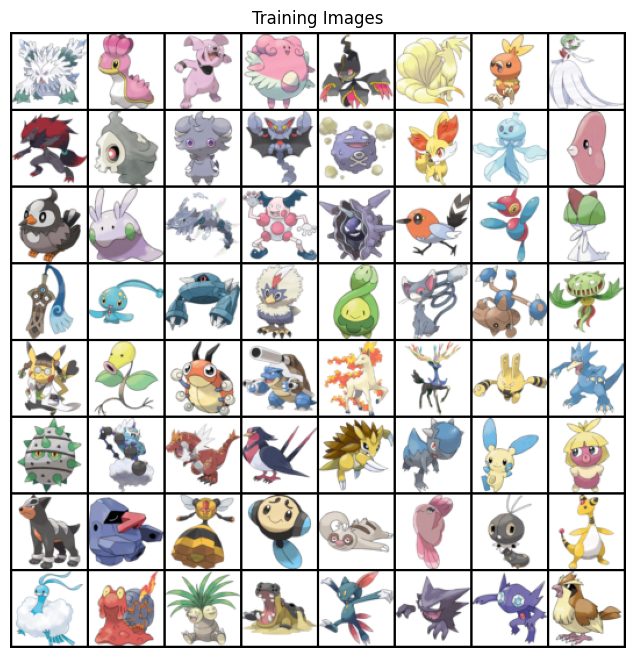

In [162]:
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torch.utils.data

import numpy as np

import torchvision.utils as vutils
import matplotlib.pyplot as plt

device = torch.device(
    "cuda" if torch.cuda.is_available() else
    "mps" if torch.backends.mps.is_available() else
    "cpu"
)

IMG_SIZE = 64
B_SIZE = 64
WORKERS = 2

dataset = datasets.ImageFolder(root="./data",
                           transform=transforms.Compose([
                               transforms.Resize(IMG_SIZE),
                               transforms.CenterCrop(IMG_SIZE),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=B_SIZE,shuffle=True, num_workers=WORKERS)

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

## network

In [163]:
import torch
import torch.nn as nn

### Generator

In [164]:
class Generator(nn.Module):
    def __init__(self, in_channels=100, out_channels=3):
        super(Generator, self).__init__()

        self.model = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(in_channels, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            # (512 * 4 * 4)
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            # (256 * 8 * 8)
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # (128 * 16 * 16)
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            # (64 * 32 * 32)
            nn.ConvTranspose2d(64, out_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # (3 * 64 * 64)
        )

    def forward(self, x):
        return self.model(x)

### Discriminator

In [165]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            # input is (in_channels * 64 * 64)
            nn.Conv2d(in_channels, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # (64 * 32 * 32)
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            #nn.LayerNorm([128, 16, 16]),
            nn.InstanceNorm2d(128, affine=True),
            #nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # (128 * 16 * 16)
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            #nn.LayerNorm([256, 8, 8]),
            nn.InstanceNorm2d(256, affine=True),
            #nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # (256 * 8 * 8)
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            #nn.LayerNorm([512, 4, 4]),
            nn.InstanceNorm2d(512, affine=True),
            #nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # (512 * 4 * 4)
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid() # binary classifier
        )

    def forward(self, x):
        return self.model(x)

## Weight Initialization

In [166]:
# weights initialization called on netG and net D
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

For the purpose of these equations, we assume that the output from the discriminator is a real number in the range $0 < D(x) < 1$ which results from squashing the raw score from the discriminator through a sigmoid function. However for a cleaner and more numerically stable implementation, we have not included the sigmoid in the discriminator architecture above -- instead we will implement the sigmoid as part of the loss function.

Given a score $s\in\mathbb{R}$ and a label $y\in\{0, 1\}$, the binary cross entropy loss (with logits) is defined as:

$$ bce(s, y) = -y * \log(\sigma(s)) - (1 - y) * \log(1 - \sigma(s)) $$

where $\sigma(s)=1/(1+\exp(-s))$ is the sigmoid function.

Instead of computing the expectation of $\log D(G(z))$, $\log D(x)$ and $\log \left(1-D(G(z))\right)$, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing.

## Wasserstein GAN
Wasserstein distance:
$W(\mathbb{P}_r, \mathbb{P}_g) = \inf_{\gamma \in \Pi(\mathbb{P}_r, \mathbb{P}_g)} \mathbb{E}_{(x,y) \sim \gamma} [\|x - y|]$

$\left[f(x^{(i)} - f(G(z^{(i)})\right]$

$|f(x_1) - f(x_2)| \leq |x_1 - x_2|$ 1-Lipschitz function

Weight Clipping

|      | Discriminator/critic | Generator                                                                                              |
|------|----------------------|--------------------------------------------------------------------------------------------------------|
| GAN  | $\nabla_{\theta_d} \frac{1}{m} \sum_{i=1}^{m} \left[ \log D\left(x^{(i)}\right) + \log \left(1 - D\left(G\left(z^{(i)}\right)\right)\right)\right]$ | $\nabla_{\theta_g} \frac{1}{m} \sum_{i=1}^{m} - \log \left(D\left(G\left(z^{(i)}\right)\right)\right)$ |
| WGAN | $\nabla_{w} \frac{1}{m} \sum_{i=1}^{m} \left[f\left(x^{(i)}\right) - f\left(G\left(z^{(i)}\right)\right)\right]$ | $\nabla_{\theta} \frac{1}{m} \sum_{i=1}^{m} - f\left(G\left(z^{(i)}\right)\right)$ |

Gradient Penalty

$L = \underbrace{\mathbb{E}_{\tilde{x} \sim \mathbb{P}_g}[D(\tilde{x})] - \mathbb{E}_{x \sim \mathbb{P}_r}[D(x)]}_{\text{Original critic loss}} + \underbrace{\lambda \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\hat{x}}} \left[(\left\|\nabla_{\hat{x}} D(\hat{x})\right|_{2} - 1\right)^{2}]}_{\text{gradient penalty}}$

λ is set to 10. 

$\text{where } \hat{x} \text{ sampled from } \tilde{x} \text{ and } x \text{ with } t \text{ uniformly sampled between 0 and 1}$

$\hat{x} = t\tilde{x} + (1 - t)x \text{ with } 0 \leq t \leq 1$

Batch normalization is avoided for the critic (discriminator). Batch normalization creates correlations between samples in the same batch. It impacts the effectiveness of the gradient penalty which is confirmed by experiments.


In [167]:
def gradient_penalty(D, x_real, x_fake):
    # (b, 1)
    t = torch.rand(x_real.shape[0], 1, 1, 1, device=device)
    # (b, 1) => (b, 3)
    t = t.expand(*x_real.shape)
    # interpolation
    x_mid = (t * x_real + (1 - t) * x_fake).requires_grad_(True)
    # set it requires gradient
    pred = D(x_mid)
    
    grads = torch.autograd.grad(outputs=pred, inputs=x_mid,
                          grad_outputs=torch.ones_like(pred).to(device),
                          create_graph=True, retain_graph=True, only_inputs=True)[0]
    
    gp = torch.pow(grads.norm(2, dim=1) - 1, 2).mean()
    
    return gp

## Train

In [168]:
import torch.optim as optim
import torch.nn.parallel

In [169]:
# Hyper Parameters
NUM_EPOCHS = 500
LEARNING_RATE = 2e-4
BETA_1 = 0.5
NGPU = torch.cuda.device_count()

NOISE_SIZE = 100

netG = Generator().to(device)
if (device.type == 'cuda') and (NGPU > 1):
    netG = nn.DataParallel(netG, list(range(NGPU)))
# apply weights_init to randomly initialize all weights to mean=0 std=0.02
netG.apply(weights_init)

netD = Discriminator().to(device)
if (device.type == 'cuda') and (NGPU > 1):
    netD = nn.DataParallel(netD, list(range(NGPU)))
netD.apply(weights_init)

criterion = nn.BCELoss()
# validate netG input a noise
fixed_noise = torch.randn(64, NOISE_SIZE, 1, 1, device=device)

# real labels always = 1 and fake labels always = 0
real_target = 1.
fake_target = 0.

# setup Adam
optimizerD = optim.Adam(netD.parameters(), lr=LEARNING_RATE, betas=(BETA_1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LEARNING_RATE, betas=(BETA_1, 0.999))


In [170]:
# Train
img_list = []
G_loss = []
D_loss = []
iters = 0

for epoch in range(NUM_EPOCHS):
    for step, data in enumerate(dataloader):
        real_img = data[0].to(device)
        batch_size = real_img.size(0)
        real_label = torch.ones(batch_size).to(device)# 定义真实的图片label为1
        fake_label = torch.zeros(batch_size).to(device)
        # update D maximize log(D(x)) + log(1 - D(G(z)))
        for _ in range(5):
            # train all real data
            netD.zero_grad()
            pred_real = netD(real_img).view(-1)
            loss_D_real = criterion(pred_real, real_label)
            #loss_D_real.backward()
            
            # train all fake image
            # Generator input noise
            noise = torch.randn(batch_size, NOISE_SIZE, 1, 1, device=device)
            fake_img = netG(noise)
            # classify fake image
            pred_fake = netD(fake_img.detach()).view(-1) #ues .detach() to not update netG
            loss_D_fake = criterion(pred_fake, fake_label)
            #loss_D_fake.backward()
            
            # gradient penalty
            gp = gradient_penalty(netD, real_img, fake_img.detach())
            #gp.backward()
            
            # compute error D: sum over fake and real error
            loss_D = loss_D_real + loss_D_fake + 10 * gp
            loss_D.backward(retain_graph=True)
            D_x = pred_real.mean().item()
            D_G_noise = pred_fake.mean().item()
            # update D
            optimizerD.step()
        
        # update G: maximize log(D(G(z)))
        netG.zero_grad()
        noise = torch.randn(batch_size, NOISE_SIZE, 1, 1, device=device)
        fake_img = netG(noise)
        pred_fake = netD(fake_img).view(-1) # just updated netD
        # cheat on D, fake image is real
        loss_G = criterion(pred_fake, real_label)
        loss_G.backward()
        D_G_fake = pred_fake.mean().item()
        # update G
        optimizerG.step()
        
        # output training stats
        if step % len(dataloader) == 0 and epoch % 10 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch + 1, NUM_EPOCHS, step, len(dataloader),
                     loss_D.item(), loss_G.item(), D_x, D_G_noise, D_G_fake))
            
        # save losses
        G_loss.append(loss_G.item())
        D_loss.append(loss_D.item())
        
        # validate netG
        if (iters % 500 == 0) or ((epoch == NUM_EPOCHS - 1) and (step == len(dataloader) - 1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
                                
        iters +=1

[1/500][0/14]	Loss_D: 9.8835	Loss_G: 10.2904	D(x): 0.9979	D(G(z)): 0.0002 / 0.0001
[11/500][0/14]	Loss_D: 9.9706	Loss_G: 7.7536	D(x): 0.9781	D(G(z)): 0.0483 / 0.0175
[21/500][0/14]	Loss_D: 9.9348	Loss_G: 9.1913	D(x): 0.9976	D(G(z)): 0.0059 / 0.0029
[31/500][0/14]	Loss_D: 9.9445	Loss_G: 8.2035	D(x): 0.9598	D(G(z)): 0.0052 / 0.0121
[41/500][0/14]	Loss_D: 9.8128	Loss_G: 5.2029	D(x): 0.9859	D(G(z)): 0.0104 / 0.0119
[51/500][0/14]	Loss_D: 9.9058	Loss_G: 8.7830	D(x): 0.9960	D(G(z)): 0.0033 / 0.0099
[61/500][0/14]	Loss_D: 9.8544	Loss_G: 6.3645	D(x): 0.9799	D(G(z)): 0.0074 / 0.0052
[71/500][0/14]	Loss_D: 9.8490	Loss_G: 6.1050	D(x): 0.9937	D(G(z)): 0.0329 / 0.0188
[81/500][0/14]	Loss_D: 9.9320	Loss_G: 6.6781	D(x): 0.9918	D(G(z)): 0.0017 / 0.0073
[91/500][0/14]	Loss_D: 9.8582	Loss_G: 5.5250	D(x): 0.9930	D(G(z)): 0.0434 / 0.0180
[101/500][0/14]	Loss_D: 9.9053	Loss_G: 9.8457	D(x): 0.9794	D(G(z)): 0.0049 / 0.0005
[111/500][0/14]	Loss_D: 10.0212	Loss_G: 4.9593	D(x): 0.9216	D(G(z)): 0.0422 / 0.0179
[

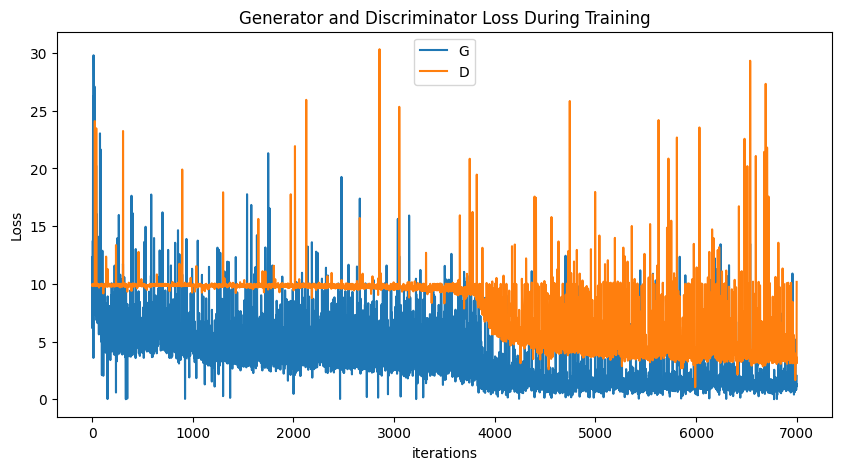

In [171]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_loss,label="G")
plt.plot(D_loss,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

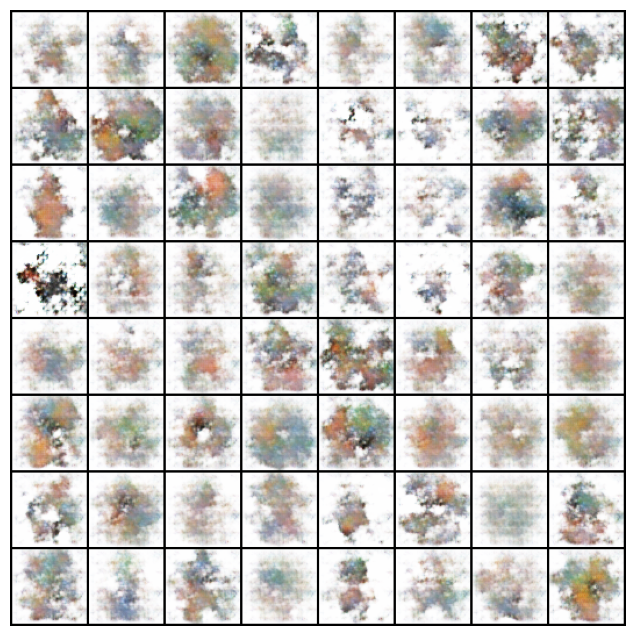

In [175]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

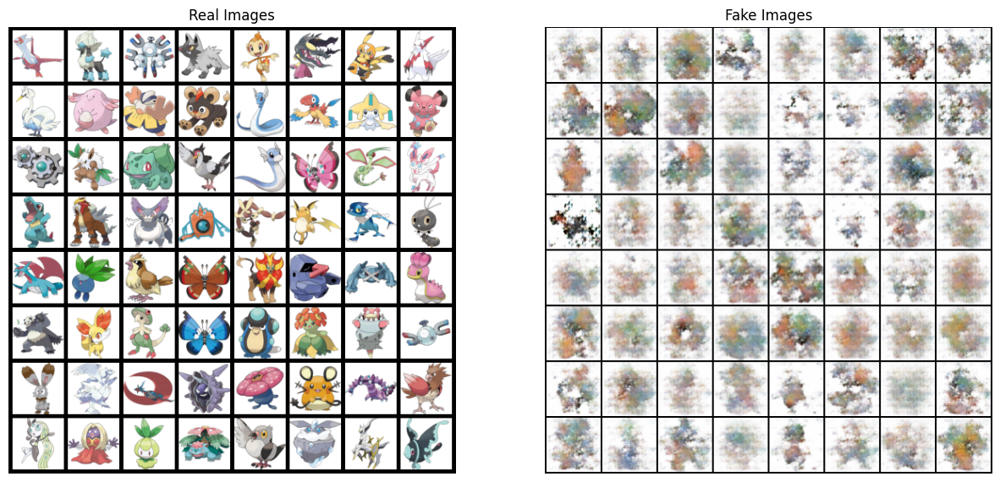

In [173]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()